<div class="alert alert-block alert-info" >
    <h1>Robot Perception</h1>
    <h3>General Information:</h3>
    <p>Please do not add or delete any cells. Answers belong into the corresponding cells (below the question). If a function is given (either as a signature or a full function), you should not change the name, arguments or return value of the function.<br><br> If you encounter empty cells underneath the answer that can not be edited, please ignore them, they are for testing purposes.<br><br>When editing an assignment there can be the case that there are variables in the kernel. To make sure your assignment works, please restart the kernel and run all cells before submitting (e.g. via <i>Kernel -> Restart & Run All</i>).</p>
    <p>Code cells where you are supposed to give your answer often include the line  ```raise NotImplementedError```. This makes it easier to automatically grade answers. If you edit the cell please outcomment or delete this line.</p>
    <br>The server resource is limited to 2 core cpu and 1GB RAM at max per user. If you use more than that, the kernel may die. Nevertheless, you can bring it up again by restaring the kernel (Kernel -> Restart and clear output).<br>
    <h3>Submission:</h3>
    <p>Please submit your notebook via the web interface (in the main view -> Assignments -> Submit). The assignments are due on <b>Monday at 0:00.</b> (i.e. Sunday 23:59 + 1 min)</p>
    <h3>Group Work:</h3>
    <p>You are allowed to work in groups of up to two people. Please enter the UID (your username here) of each member of the group into the next cell. We apply plagiarism checking, so do not submit solutions from other people except your team members. If an assignment has a copied solution, the task will be graded with 0 points for all people with the same solution.</p>
    <p><b>YOU SHOULD ONLY SUBMIT EXACTLY ONE PER GROUP</b></p>
    <h3>Questions about the Assignment:</h3>
    <p>If you have questions about the assignment please post them in the LEA forum before the deadline. Don't wait until the last day to post questions.</p></div>

<div class="alert alert-block alert-danger">
<p><b>Put your answer in the PROVIDED CELLS only!</b></p>
<b>Any new cell is not visible during the grading.</b>
<p>We provide additional code and markdown cells for each question, so that you do not have to add the new ones.</p>
<p>Do not copy the metadata from one cell to another, it is unique to that cell only.</p></div>

In [1]:
'''
Group Work:
Enter the UID (i.e. student2s) of each team member into the variables. 
If you work alone please leave the second variable empty, or extend the list if necessary.
'''
member1 = 'dpadma2s'
member2 = 'jbandl2s'
member3 = 'smuthi2s'

In [2]:
'''
Put here the average solution time for the full exercise set in estimated MINUTES".
AverageSolutionTimeinMinutes should be > or < 4711
i.e.
AverageSolutionTimeinMinutes = 180
'''

AverageSolutionTimeinMinutes = 920

In [3]:
# This is a test cell, please ignore it!

## Q&As: Pose three questions (and ans.) to last lecture, 3 Q&As per member [1 point]

The format of the question and answer should be [Q1,A1,Q2,A2,Q3,A3,...,Qn,An], where Q1 is the question and A1 is the answer.<br>
If you work in a group, the total of the Q&As is $3xn$, where $n$ is the total number of members.<br>

Put your answer in the provided cell below!<br>
If you work in a group, you can extend the provided Q&A template, but please use the same format:
1. Q and A are separated by ONE $<$br$>$
2. Q&A and other Q&As are separated by TWO $<$br$>$

Or copy the provided format in the answer cell, and change the Q&A number.
<br>
Do not remove any markdown tag like $<$br$>$ in the answer cell.

<br>
Q1 = Given that only $50 \%$ of point matches are good, and given 4 points picked to estimate homography. How many iterations are needed to have a $95 \%$ probability of success?
<br>
A1 = We know the relationship between the number of trials N, sample size s, outlier ratio e and probability of success p, as given below

$e$ is the probability of outliers

$1-e$ is the probability of inliers

$(1-e)^s$ is the probability of choosing a set of s samples that are all inliers.

$1- (1-e)^s$ is the probability of choosing s points that are NOT all inliers (one of more outliers)

$(1- (1-e)^s)^N$ is the probability of choosing s points N times, and having every set of points include one or more outliers.

Therefore, Probability of choosing s points N times and having one or more sets of all inliers,

\begin{equation}p = 1 - (1-(1-e)^s)^N\end{equation}

In this problem, $\mathrm{e}=.5, s=4,$ and $p=.95$ 

Plugging into the formula, we get:

$1-\left(1-(1-.5)^{4}\right)^{\mathrm{N}}=.95$

Simplify and solve for $\mathrm{N}:$

$$
\begin{array}{l}
1-\left(1-\left(.5^{4}\right)\right)^{\mathrm{N}}=.95 \\
1-(1-.0625)^{\mathrm{N}}=.95 \\
(0.9375)^{\mathrm{N}}=1-.95=.05 \\
\mathrm{N}=\log (.05) / \log (0.9375)=46.4177 \approx47
\end{array}
$$

So, 47 iterations are needed to have a $95 \%$ probability of success [1].

Question Inspiration/Source: https://www.cs.umd.edu/class/spring2018/cmsc426/Assignments/cmsc426_hw1_answer_key.pdf

<br>
<br>
Q2 = Given 100 feature points identified in two images, how many possible combinations of 4 point pairs can one pick?  By what order of magnitude does performing RANSAC improve over brute-force (i.e.  trying all possible 4 point combinations)?
<br>
A2 = 

**Brute-force:**

To brute-force the point matches, we need to pair every possible set of 4-points in each image with each other. This is a combinatorics problem.

For each image, there are $100C_4$ sets of points. Thus there are $(100C_4)^2$ pairings of the sets from both images.

For each pair of 4-point sets, there are 4! ways to match up their points.

Thus the total possible pairings is $(4!) \times (100C_4)^2 = 24\times (3921225)^2 $

The complexity of brute-force problem is:

$100C_4$ is $\frac{100!}{4!\times96!}$ simplifying to (100 x 99 x 98 x 97)/4!. Based on numerator, $nC_k$ is $O(n^4)$. Since we square, $100C_4$ in our problem, brute-forcing complexity if $O(n^8)$ [1].

**RANSAC:**

Let probability  of success = 0.9999 of getting an inlier sample.

We know the relationship between the number of trials N, sample size s, outlier ratio e and probability of success p, as given below:


\begin{equation}p = 1 - (1-(1-e)^s)^N\end{equation}

\begin{equation}\mathrm{N}=\frac{log (1-\mathrm{p})}{log (1-(1-\mathrm{e})^ 4)}\end{equation}

For p = 0.9999 $N \approx \frac{-9.2103}{log(1-(1-e)^4)}$

Number of iterations is a function of e, probability of a point being an outlier.

If e is very bad, say 0.9, then N $\approx$ 90000.

If e is very good, say 0.2, then N $\approx$ 17.

In practice e is rarely bad. Considering the worst case scenario, RANSAC gives atleast 5 order-of-magnitude improvement [1].

Question Inspiration/Source: https://www.cs.umd.edu/class/spring2018/cmsc426/Assignments/cmsc426_hw1_answer_key.pdf
<br>
<br>
Q3 = State the pros, cons and some applications of RANSAC?
<br>
A3 = 

**Good:**

* Robust to outliers.
* Applicable for number of object function parameters of upto $\approx$ 10.
* Applicable for larger number of parameters and parameters are easily obtained than Hough transform [2][3].


**Bad:**

* Computational time grows quickly with fraction of outliers and number of parameters.
* Not good for getting multiple fit [2][3].

**Applications:**

* Computing a homography (e.g., image stitching).
* Estimating fundamental matrix (relating two views).
* Domain plane from a aerial laser scanes.
* Feature-based alignment and feature tracking [2][3].
<br>
<br>

Q4 = How is RANSAC different from conventional smoothing techniques ?

A4 = The RANSAC procedure is opposite to that of conventional smoothing techniques: Rather than using as much of the data as
possible to obtain an initial solution and then attempting to eliminate the invalid data points, RANSAC uses as small an initial data set as feasible and enlarges this set with consistent data when possible

<br>
<br>

Q5 = if two sampled datasets $ s_{1} $ and $ s_{2} $ has equally sized Consensus sets $S_{i}$ and $S_{j}$. How do we chose which sampled set should be used to create the model ?
<br>
A5 = The subset which has smallest standard deviation in the inliers is chose in case of ties.
<br>
<br>
Q6 = What are various RANSAC initilization methods ?
<br>
A6 = An initial estimate for the parametrization may be found by employing a linear technique like DLT algorithm, directly provides H and hence the 9-vector h used to parametrize the iterative minimization. In general if there are n ≥ 4 correspondences, then all will be used in the linear solution.Linear techniques or minimal solutions are the two initialization
techniques recommended in Hartley and Zissermann, 

The other initilization methods are An alternative method that is sometimes used is to carry out a sufficiently dense sampling of parameter space, iterating from each sampled starting point and retaining the best result. This is only possible if the dimension of the parameter space is sufficiently small. Another initialization method is simply to do without any effective initialization at all, starting the iteration at a given fixed point in parameter space. This method is not often viable. Iteration is very likely to fall into a false minimum or not converge. 
<br>
<br>
Q7 = What are the assumptions made in RANSAC?
<br>
A7 =
* Data consists of "inliers", i.e., data whose distribution can be explained by some set of model parameters, though may be subject to noise.
* Data consists of "outliers" which are data that do not fit the model. The outliers can come, for example, from extreme values of the noise or from erroneous measurements or incorrect hypotheses about the interpretation of data.
* One more assumption states that, given a (usually small) set of inliers, there exists a procedure which can estimate the parameters of a model that optimally explains or fits this data.
<br>
<br>

Q8 = What are the free paramneters in RANSAC and how are they dwetermined?
<br>
A8 =

1) t: the distance thresold value to determine when a data point fits a model. t can be determined empirically, or, if the error distribution is known to be Gaussian with standard deviation, a 95% or similar confidence interval can be calculated.

2) T: the minimum number of inliner for early termination. T, the acceptable consensus set size, should be approximately the number of inliers thought to be in the data.

3) N: The number of samples, Choose N so that, with probability p, at least one random sample is free from outliers. e.g. p=0.99.
<br>
<br>
Q9 = What is the computation complexity associated with RANSAC?
<br>
A9 =

**Hypothesize Step:**

At each iteration we need to compute the parameters of the model starting from the
MSS (whose cardinality is k). Let’s define the cost of this operation to be $C_{estimate}(k)$.

**Test Step:**

Once the parameters have been estimated we need to evaluate how many data fit the
model. If the cost associated to compute the fitting of one single element is
$C_{fitting}$, then the overall cost is $NC_{fitting}$, where N is total number of samples.

**Overall Comlpexity:**

Putting together the cost of the hypothesize and test steps, the overall complexity of the alogorithm in the worst case scenario is:
$$
Complexity = O(T_{iteration}(C_{estimate}(k)+NC_{fitting}))
$$
<br>
<br>

**Contribution:**

Q1-Q3: dpadma2s

Q4-Q6: jbandl2s

Q7:Q8: smuthi2s

In [4]:
# This is a test cell, please ignore it!

## Task 1: Implement a base line RANSAC (by hand) to calculate Homography


************* RANSAC FOR BOAT EXAMPLE ON THE CORRESPONDENCE POINTS GIVEN PREVIOUSLY ***************

Total iterations: 15
Number of inliers: 21
Desired homography, H computed using RANSAC:
 [[  0.87197193   0.23556633   3.47197519]
 [ -0.21735299   0.88320792 129.4879814 ]
 [  0.           0.           1.        ]]


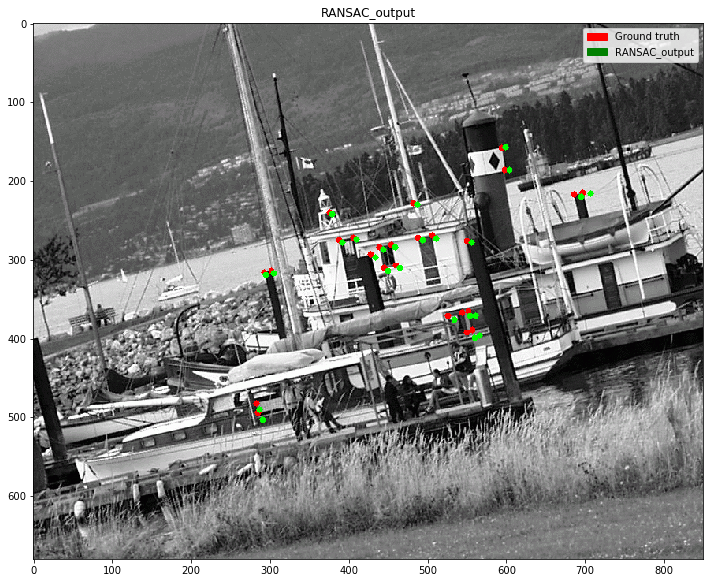


************* RANSAC FOR BOAT ON ORB GIVEN CORRESPONDENCE POINTS ***************

Reading image1:  data/boat1.png
Reading image2:  data/boat2.png
Total number of putative correspondence: 100
Total iterations: 15
Number of inliers: 74
Desired homography, H computed using RANSAC:
 [[  0.86066301   0.20940676  10.82056447]
 [ -0.20867278   0.85528689 130.22072501]
 [  0.           0.           1.        ]]


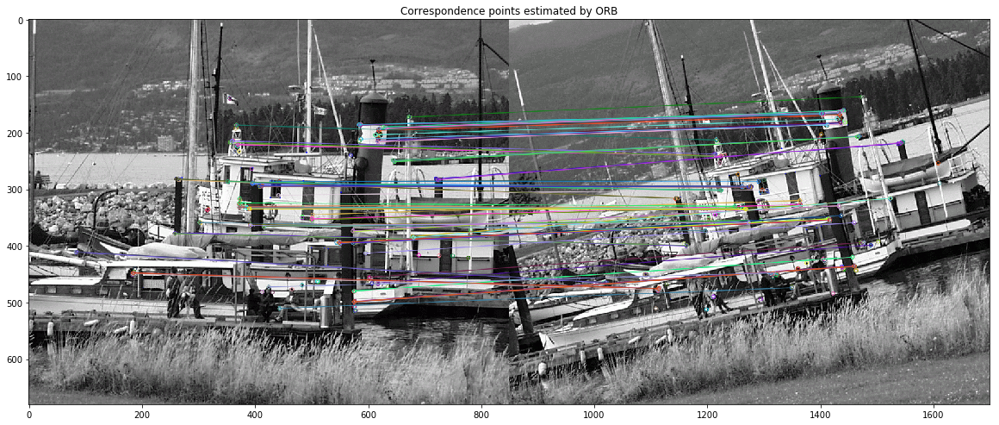

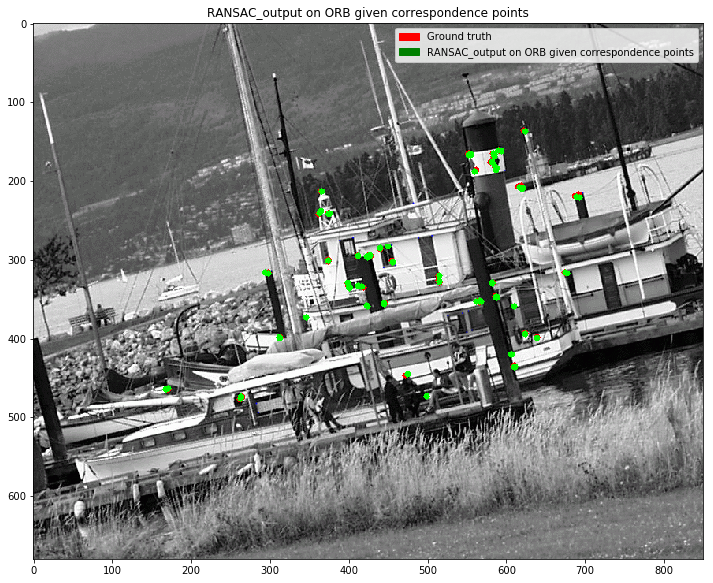

In [3]:
from __future__ import print_function
import typing
import cv2
import numpy as np
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
from matplotlib import image
from copy import deepcopy
import math
import random
import time


def correspondence_points(im1, im2, GOOD_MATCH_PERCENT=0.5, MAX_FEATURES=200):

    # Convert images to grayscale
    im1Gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
    im2Gray = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)

    # Detect ORB features and compute descriptors.
    orb = cv2.ORB_create(MAX_FEATURES)
    keypoints1, descriptors1 = orb.detectAndCompute(im1Gray, None)
    keypoints2, descriptors2 = orb.detectAndCompute(im2Gray, None)

    # Match features.
    matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
    matches = matcher.match(descriptors1, descriptors2, None)

    # Sort matches by score
    matches.sort(key=lambda x: x.distance, reverse=False)

    # Remove not so good matches
    numGoodMatches = int(len(matches) * GOOD_MATCH_PERCENT)
    matches = matches[:numGoodMatches]
    
    # Draw top matches
    imMatches = cv2.drawMatches(im1, keypoints1, im2, keypoints2, matches, None)
#     cv2.imwrite("matches.jpg", imMatches)
    plt.figure(figsize=(20,18))
    plt.imshow(imMatches)
    plt.title('Correspondence points estimated by ORB')

    # Extract location of good matches
    points1 = np.zeros((len(matches), 2), dtype=np.float32)
    points2 = np.zeros((len(matches), 2), dtype=np.float32)

    for i, match in enumerate(matches):
        points1[i, :] = keypoints1[match.queryIdx].pt
        points2[i, :] = keypoints2[match.trainIdx].pt

    
    return points1, points2

def load_boat_given(points_file: str) -> np.ndarray:
        '''
        Parser to read the correspondence points in img1 and img2
        '''
        
        f = open(points_file)

        image_points = dict()
        for n,line in enumerate(f.readlines()):

            line = line.replace('[','').replace(']','').strip()
            pointlist = line.split('=')[1].split(';')
            x = list()
            y = list()

            for point in pointlist:
                x.append(int(point.split(',')[0]))
                y.append(int(point.split(',')[1]))
            image_points[n] = np.vstack((x,y))

        return image_points[0], image_points[1]
    


def get_inputs(example, GOOD_MATCH_PERCENT=0.5, MAX_FEATURES=200):
    
    if example == 'boat_given':
        
        points_file = './data/boat_homography.txt'
        img_path1 = './data/boat1.png'
        img_path2 = './data/boat2.png'
        x, x_prime = load_boat_given(points_file)
        
        return x, x_prime,img_path1, img_path2
        
    else:
        if example == 'boat':

            img_path1 = 'data/boat1.png'
            img_path2 = 'data/boat2.png'

        elif example == 'notredame':

            img_path1 = 'data/notredame1.png'
            img_path2 = 'data/notredame2.png'

        elif example == 'mount_rushmore':

            img_path1 = 'data/mount_rushmore1.png'
            img_path2 = 'data/mount_rushmore2.png' 

        print("Reading image1: ", img_path1)
        im1 = cv2.imread(img_path1, cv2.IMREAD_COLOR)

        print("Reading image2: ", img_path2);  
        im2 = cv2.imread(img_path2, cv2.IMREAD_COLOR)

        x, x_prime = correspondence_points(im1, im2, GOOD_MATCH_PERCENT, MAX_FEATURES)
        print('Total number of putative correspondence:', x.shape[0])
        x = x.transpose()
        x_prime = x_prime.transpose()

        return x, x_prime , img_path1, img_path2
    
def draw_helper(H, x, x_prime, image_save_name, img_path2):
        
        img2 = cv2.imread(img_path2)
        
        img2_observed = deepcopy(img2)
        
        x_prime = x_prime.astype(int)
        x_p_observed = np.dot(H,np.vstack((x,np.ones((1,x.shape[1]))))) 
        x_p_observed = x_p_observed.astype(int)
        
        for i in zip(x_prime[0], x_prime[1]):
            cv2.circle(img2_observed,(i),1,(255,0,0), 5) # OpenCV- BLUE #  In MATPLOTLIB- B AND R are swapped.
        
        for i in zip(x_p_observed[0], x_p_observed[1]):
            cv2.circle(img2_observed,(i),1,(0,255,0), 5) # OpenCV- GREEN # In MATPLOTLIB- GREEN patch is darker
        
        plt.figure(figsize=(12,10))
        plt.imshow(img2_observed)
        plt.title(image_save_name)
        red_patch = mpatches.Patch(color='red', label='Ground truth')
        green_patch = mpatches.Patch(color='green', label=image_save_name)
        plt.legend(handles=[red_patch, green_patch])
        plt.show()
        label1 = 'Blue- Ground truth, Green - '+ image_save_name
        cv2.putText(img2_observed,label1, (20,20), cv2.FONT_HERSHEY_PLAIN, 1, (0, 0, 255), 2, cv2.LINE_AA )
        cv2.imwrite('data/'+ image_save_name +'.png', img2_observed)
        
        return x_p_observed


class Perform_RANSAC():
    
    def __init__(self):
        
        np.set_printoptions(suppress=True)
        
    def normalize(self, x: np.ndarray) -> np.ndarray:
        
        '''
        Normalizes a given matrix, x by performing similarity transformation.
        Now the centroid of the new points has (0,0)^T and the average distance 
        from the origin is square.root(2)
        '''

        x_bar = np.asarray(x)
        m = np.mean(x,1)

        deno = list()

        for i in x.transpose():
            deno.append(list(i-m))
        deno = np.square(np.array(deno))
        total = 0
        for i in deno:
            total = sum(i)**(1/2.) + total

        s = 2**(1/2)/(total/len(deno))

        T = np.array([[s, 0, -s*m[0]], [0, s, -s*m[1]], [0, 0, 1]])

        x = np.vstack((x, np.ones((1,x.shape[1]))))

        x_bar = np.dot(T, x)
        
        return x_bar, T

    def DLT(self, x: np.ndarray, x_bar: np.ndarray, to_P2 = False) -> np.ndarray:
        '''
        Performs DLT on the x and x' provided
        '''
        
        if to_P2:
            x = np.vstack((x, np.ones((1, x.shape[1]))))
            x_bar = np.vstack((x_bar, np.ones((1, x_bar.shape[1]))))

        # Initializations for A matrix
        a_12 = list()
        a_13 = list()
        a_21 = list()
        a_23 = list()
        result = list()
        
        # Forming A matrix as provided in Reference 1 and Hartley and zisserman multiple view geometry

        for i,j in zip(x.transpose(), x_bar.transpose()):

            a_12= np.array([list(-np.dot(j[2],i.transpose()))])
            a_13= np.array([list(np.dot(j[1],i.transpose()))])
            a_21= np.array([list(np.dot(j[2],i.transpose()))])
            a_23= np.array([list(-np.dot(j[0],i.transpose()))])

            r1 = np.hstack((np.hstack((np.zeros((1,3)),a_12)),a_13))
            r2 = np.hstack((np.hstack((a_21,np.zeros((1,3)))),a_23))

            a = np.vstack((r1,r2))   

            for k in a:
                result.append(list(k))

        A = np.array(result)
        
        # Ah = 0 ;Minimizing ||Ah|| such that ||h||=1
        # Solution by SVD
        
        U,s,Vt = np.linalg.svd(A)
        V=Vt.T
        h=V[:,-1] # Last column of V corresponding eigen vector to the smallest eigen value
        
        h = np.reshape(h,(3,3))

        return h
    
    def desired_H(self, T_bar, T_prime_bar, H_normalized):
        
        '''
        Used for finding H in unnormalized original co-ordinates from normalized H' by performing,
        H = inverse(T') H' T
        '''
        
        non_scaled_H = np.dot(np.linalg.inv(T_prime_bar),(np.dot(H_normalized, T_bar)))
        
        # Scaling H such that H(3,3) is 1.
        desired_H = non_scaled_H/non_scaled_H[2][2]
        
        # Considering the affine nature of H
        desired_H[2][0] = 0
        desired_H[2][1] = 0
        
        return desired_H
    
    def check_collinearity(self, x, y):
        ''' Uses slope to check collinearity between 3 points
        where x and y are the x and y coordinates respectively'''
        
        if ((y[2] - y[1])*(x[1] - x[0]) == (y[1] - y[0])*(x[2] - x[1])): 
            return True
        else: 
            return False 
    
    def check_collinearity_parser(self, points):
        
        '''
        Given 4 points in an array, checks whether any 3 are collinear
        '''
        
        points_set1 = points[:,:3]
        points_set2 = points[:,1:4]
        
        set1 = self.check_collinearity(points_set1[0,:], points_set1[1,:])
        set2 = self.check_collinearity(points_set1[0,:], points_set1[1,:])
        
        if set1 and set2:
            flag = True # The points are collinear
        else:
            flag = False # The either set is non-collinear
        
        return flag
        
    
    def RANSAC(self, x, x_prime):
        
        '''
        RANSAC to find the best amount of inliers
        '''
        
        # For reproducible results for debugging purpose
        random.seed(146)
        
        # Initial dictionaries for holding the inliers or each N with error in total_dist
        inliers_x = dict()
        inliers_x_prime = dict()
        H = dict()
        total_dist = dict()
        
        num_points = x.shape[1]
        threshold_of_inliers = num_points - 1
        p_success = 0.9999
        sample_size = 4
        
        N = np.inf
        i = 0 # Loop counter
        
        while N>i:
            
            # Sample index
            points = random.sample(range(num_points), 4)            
            
            # Sample x points
            x_sampled = x[:,points]
            # Check collinearity
            collinear_x = self.check_collinearity_parser(x_sampled)
            
            # Sample x_prime
            x_prime_sampled = x_prime[:, points]
            # Check collinearity
            collinear_x_prime = self.check_collinearity_parser(x_prime_sampled)
            
            
            # Sample selection should not include collinear points to avoid degenerate solutions for H
            # Avoid collinear samples in x and corresponding xprime
            while (collinear_x and collinear_x_prime):

                points = random.sample(range(num_points), 4)
                x_sampled = x[:,points]
                collinear_x = self.check_collinearity_parser(x_sampled)
                x_prime_sampled = x_prime[:, points]
                collinear_x_prime = self.check_collinearity_parser(x_prime_sampled)
                
            
            # Perform Normalized DLT
            # Normalize x to overcome the numerical calculation issues in DLT
            x_bar, T_bar = self.normalize(x_sampled)    
            # Normalize x_prime to overcome the numerical calculation issues in DLT
            x_prime_bar, T_prime_bar = self.normalize(x_prime_sampled)
            # Perform DLT
            H_normalized = self.DLT(x_bar, x_prime_bar)
            # Get desired H by mapping to original image scales.
            H[i] = self.desired_H(T_bar, T_prime_bar, H_normalized)
            
            # Compute x' = Hx
            x_prime_computed = np.dot(H[i],np.vstack((x, np.ones((1, x.shape[1])))))
            # Slice only the x,y coordinate
            x_prime_computed = x_prime_computed[:-1,:]
            
            # Calculate d(x', Hx)
            difference_xprime = x_prime_computed - x_prime
            distance_2 = np.sqrt(np.sum(np.square(difference_xprime), axis=0))
            
            # Compute x =  H^(-1)x'
            x_computed = np.dot(np.linalg.pinv(H[i]), np.vstack((x_prime_computed, np.ones((1, x_prime_computed.shape[1])))))
            x_computed = x_prime_computed[:-1,:]
            
            # Calculate d(x, H^(-1)x')
            difference_x = x_computed - x
            distance_1 = np.sqrt(np.sum(np.square(difference_x), axis=0))
    
            # Distance = Reprojection error = d = (d(x, H^(-1)x')^2 + d(x', Hx)^2)^(1/2)
            d_reprojection_error = np.sqrt(np.square(distance_1) + np.square(distance_2))
            
            # Total error
            total_dist[i] = np.sum(d_reprojection_error)
            # standar deviation of the reprojection error of each point
            std_diff = np.std(d_reprojection_error)
            # Threshold = root(5.99) x standard deviation
            threshold = std_diff * (5.99)**(0.5)

            # Inliers = d_reprojectionerror < threshold
            inlier_idx = np.where(d_reprojection_error<threshold)[0]

            # Inliers in x 
            inliers_x[i] = x[:,inlier_idx]
            # Inliers in x_prime
            inliers_x_prime[i] = x_prime[:,inlier_idx]
            
            num_inliers = inliers_x[i].shape[1]
            
            if num_inliers >= threshold_of_inliers:
                break
            
            prob_outlier = 1 - ((inliers_x[i].shape[1])/(num_points))
            N = float(np.log(1-p_success))/float((np.log(1-prob_outlier**sample_size)))
            i = i+1
            
        print('Total iterations:',i)
        # Find the index with maximum inlier count
        inlier_counts = list()        
        for i,v in inliers_x.items():  
            inlier_counts.append(v.shape[1])
#             print('Iteration, inliercount, error:', i, v.shape[1], total_dist[i])
        max_inlier_count = np.argmax(np.array(inlier_counts))
        print('Number of inliers:', inliers_x[max_inlier_count].shape[1])
        # Output the inliers of the image 1 with their correspondence points
        RANSAC_ouput = (inliers_x[max_inlier_count], inliers_x_prime[max_inlier_count])
        
        return RANSAC_ouput

print('\n************* RANSAC FOR BOAT EXAMPLE ON THE CORRESPONDENCE POINTS GIVEN PREVIOUSLY ***************\n')

EXAMPLE = 'boat_given'

# Get initial corresponding points
x_in, x_prime_in, img_path1, img_path2 = get_inputs(EXAMPLE)

homography = Perform_RANSAC()
# Perform RANSAC Get outliers
x, x_prime = homography.RANSAC(x_in,x_prime_in)

# Normalize x to overcome the numerical calculation issues in DLT
x_bar, T_bar = homography.normalize(x)

# Normalize x' to overcome the numerical calculation issues in DLT
x_prime_bar, T_prime_bar = homography.normalize(x_prime)

# Find H normalized
H_normalized = homography.DLT(x_bar, x_prime_bar)

# Find H mapping to original image scales.
H_RANSAC = homography.desired_H(T_bar, T_prime_bar, H_normalized)

print('Desired homography, H computed using RANSAC:\n', H_RANSAC)
x_prime_computed_RANSAC = draw_helper(H_RANSAC, x_in, x_prime_in, 'RANSAC_output', img_path2)

print('\n************* RANSAC FOR BOAT ON ORB GIVEN CORRESPONDENCE POINTS ***************\n')
EXAMPLE = 'boat'
# Get initial corresponding points
x_in, x_prime_in, img_path1, img_path2 = get_inputs(EXAMPLE)

homography = Perform_RANSAC()
# Perform RANSAC Get outliers
x, x_prime = homography.RANSAC(x_in,x_prime_in)

# Normalize x to overcome the numerical calculation issues in DLT
x_bar, T_bar = homography.normalize(x)

# Normalize x' to overcome the numerical calculation issues in DLT
x_prime_bar, T_prime_bar = homography.normalize(x_prime)

# Find H normalized
H_normalized = homography.DLT(x_bar, x_prime_bar)

# Find H mapping to original image scales.
H_RANSAC = homography.desired_H(T_bar, T_prime_bar, H_normalized)

print('Desired homography, H computed using RANSAC:\n', H_RANSAC)
x_prime_computed_RANSAC = draw_helper(H_RANSAC, x_in, x_prime_in, 'RANSAC_output on ORB given correspondence points', img_path2)




************* RANSAC FOR MOUNT RUSHMORE IMAGES ON ORB GIVEN CORRESPONDENCE POINTS ***************

Reading image1:  data/mount_rushmore1.png
Reading image2:  data/mount_rushmore2.png
Total number of putative correspondence: 40
Total iterations: 12
Number of inliers: 30
Desired homography, H computed using RANSAC:
 [[ -1.19498158   0.83891776 425.5346438 ]
 [ -1.22936685   1.01757203 429.65748687]
 [  0.           0.           1.        ]]


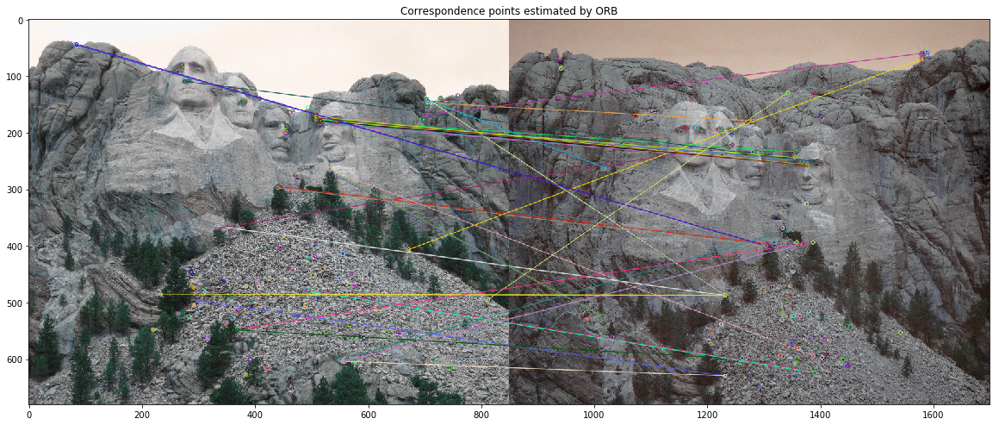

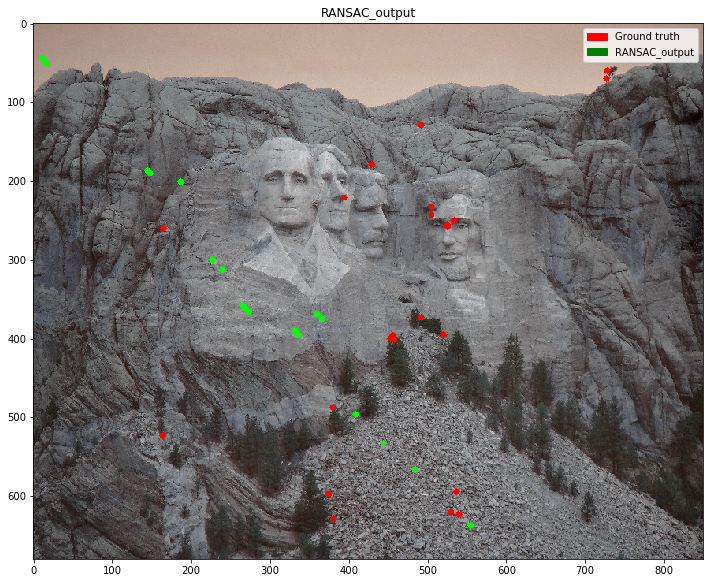

THE PUTATIVE CORRESPONDENCE POINTS ARE WRONG BETWEEN X and XPRIME, RANSAC CANNOT BE A RESCUER.


In [4]:
'''The QUALITY OF THE CORRESPONDENCE POINTS provided as inputs play a major role.
PLEASE LOOK AT THE EXAMPLE BELOW:
The efficiency of the ORB based keypoints are not very good visually
and the result of the RANSAC based estimation is inefficient.'''

print('\n************* RANSAC FOR MOUNT RUSHMORE IMAGES ON ORB GIVEN CORRESPONDENCE POINTS ***************\n')

EXAMPLE = 'mount_rushmore'
# Get initial corresponding points
x_in, x_prime_in, img_path1, img_path2 = get_inputs(EXAMPLE, GOOD_MATCH_PERCENT=0.2, MAX_FEATURES=200)

homography = Perform_RANSAC()
# Perform RANSAC Get outliers
x, x_prime = homography.RANSAC(x_in,x_prime_in)

# Normalize x to overcome the numerical calculation issues in DLT
x_bar, T_bar = homography.normalize(x)

# Normalize x' to overcome the numerical calculation issues in DLT
x_prime_bar, T_prime_bar = homography.normalize(x_prime)

# Find H normalized
H_normalized = homography.DLT(x_bar, x_prime_bar)

# Find H mapping to original image scales.
H_RANSAC = homography.desired_H(T_bar, T_prime_bar, H_normalized)

print('Desired homography, H computed using RANSAC:\n', H_RANSAC)
x_prime_computed_RANSAC = draw_helper(H_RANSAC, x_in, x_prime_in, 'RANSAC_output', img_path2)

print('THE PUTATIVE CORRESPONDENCE POINTS ARE WRONG BETWEEN X and XPRIME, RANSAC CANNOT BE A RESCUER.')




The implementation of RANSAC to estimate homography using Normalized Direct Linear Transformation illustrates when the number of putative correspondence pairs increases the performance is relatively better to the ground truth. For instance, on using the 25 points and using 100 initial points for RANSAC for this IMAGE PAIRS, the ground-truth matching is relatively better. The major parameters affecting the RANSAC based estimation based on the implementation as a learning are: 

1. Threshold for accepting inliers
2. Number of trials performed.
3. Quality of the samples taken. For instance, collinear points result in inaccurate H estimation.

YOUR ANSWER HERE

## Task 2: Compare your new RANSAC algorithm

### a) Compare your new RANSAC algorithm to your hand made DLT

HELP:
4 example pairs are provided in the folder data/:
1. BOAT using the correspondence point provided (boat_given)
2. BOAT using Oriented FAST and Rotated BRIEF (ORB) to calculate correspondence (boat)
3. MOUNT RUSHMORE using ORB to calculate correspondence (mount_rushmore)
4. NOTRE DAME using ORB to calculate correspondence (notredame)
Set the example name provided in the brackets for the variable EXAMPLE.
DEFAULT is boat_given.


************* RANSAC FOR BOAT ON ORB GIVEN CORRESPONDENCE POINTS ***************

Reading image1:  data/boat1.png
Reading image2:  data/boat2.png
Total number of putative correspondence: 100
Total iterations: 15
Number of inliers: 74
Desired homography, H computed using RANSAC:
 [[  0.86066301   0.20940676  10.82056447]
 [ -0.20867278   0.85528689 130.22072501]
 [  0.           0.           1.        ]]


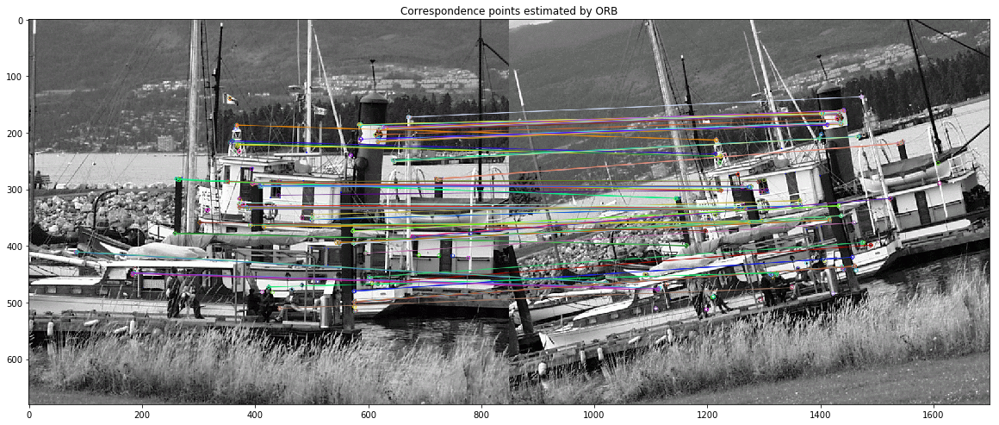

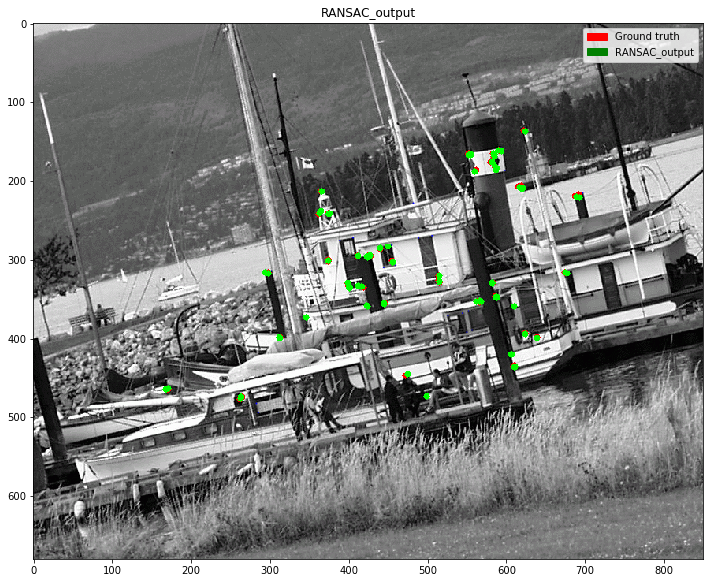


************* DLT FOR BOAT ON ORB GIVEN CORRESPONDENCE POINTS ***************

Reading image1:  data/boat1.png
Reading image2:  data/boat2.png
Total number of putative correspondence: 100
Desired homography, H computed using DLT only:
 [[  0.84308664   0.19483674  17.33426527]
 [ -0.21283261   0.83833794 133.41939398]
 [  0.           0.           1.        ]]


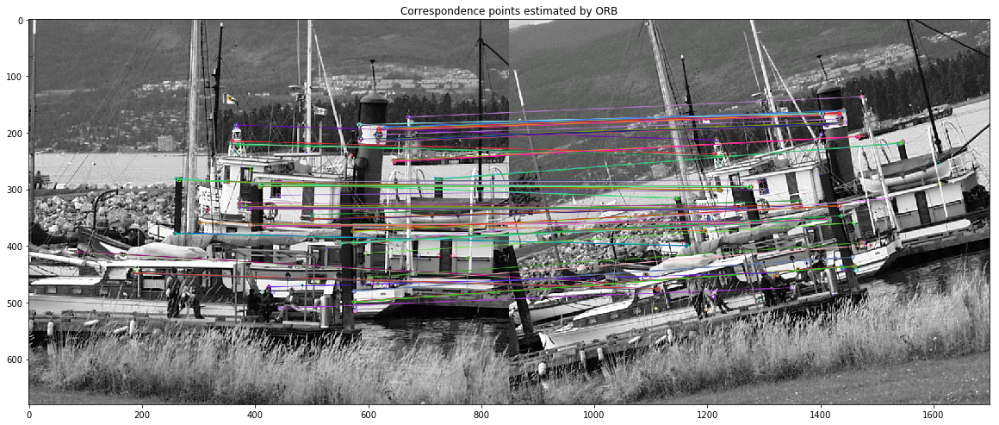

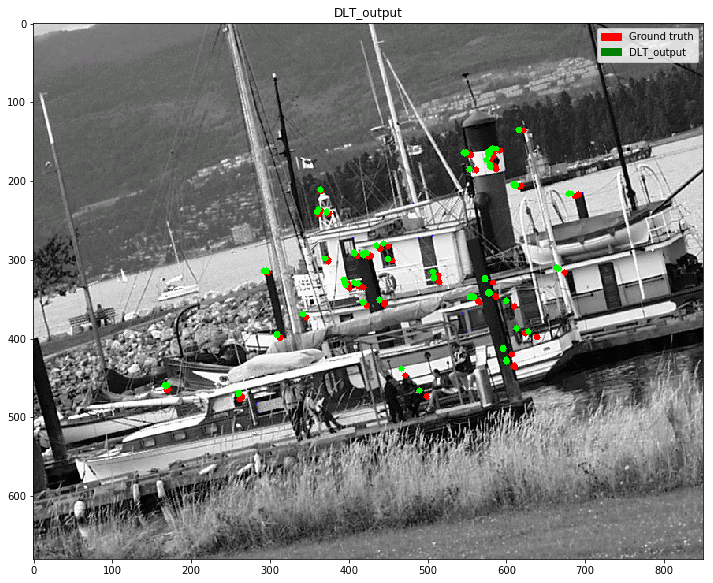

In [8]:
# HELP
print('HELP:\n4 example pairs are provided in the folder data/:\n1. BOAT using the correspondence point provided (boat_given)')
print('2. BOAT using Oriented FAST and Rotated BRIEF (ORB) to calculate correspondence (boat)')
print('3. MOUNT RUSHMORE using ORB to calculate correspondence (mount_rushmore)')
print('4. NOTRE DAME using ORB to calculate correspondence (notredame)')
print('Set the example name provided in the brackets for the variable EXAMPLE.\nDEFAULT is boat_given.\n')

print('\n************* RANSAC FOR BOAT ON ORB GIVEN CORRESPONDENCE POINTS ***************\n')

EXAMPLE = 'boat'
# Get initial corresponding points
x_in, x_prime_in, img_path1, img_path2 = get_inputs(EXAMPLE)

time1 = time.time()

homography = Perform_RANSAC()
# Perform RANSAC Get outliers
x, x_prime = homography.RANSAC(x_in,x_prime_in)

# Normalize x to overcome the numerical calculation issues in DLT
x_bar, T_bar = homography.normalize(x)

# Normalize x' to overcome the numerical calculation issues in DLT
x_prime_bar, T_prime_bar = homography.normalize(x_prime)

# Find H normalized
H_normalized = homography.DLT(x_bar, x_prime_bar)

# Find H mapping to original image scales.
H_RANSAC = homography.desired_H(T_bar, T_prime_bar, H_normalized)

time2 = time.time()
time_RANSAC = round(time2 - time1, 5)

print('Desired homography, H computed using RANSAC:\n', H_RANSAC)
x_prime_computed_RANSAC = draw_helper(H_RANSAC, x_in, x_prime_in, 'RANSAC_output', img_path2)

# Combining two different programs into a single cell because the second cell is used for comparison
class Perform_DLT():
    
    def __init__(self):
        
        np.set_printoptions(suppress=True)
        
    def DLT(self, x: np.ndarray, x_bar: np.ndarray, to_P2=False) -> np.ndarray:
        '''
        Performs DLT on the x and x' provided
        '''
        if to_P2:
            x = np.vstack((x, np.ones((1,x.shape[1]))))
            x_bar = np.vstack((x_bar, np.ones((1,x_bar.shape[1]))))

        # Initializations for A matrix
        a_12 = list()
        a_13 = list()
        a_21 = list()
        a_23 = list()
        result = list()
        
        # Forming A matrix as provided in Reference 1 and Hartley and zisserman multiple view geometry

        for i,j in zip(x.transpose(), x_bar.transpose()):

            a_12= np.array([list(-np.dot(j[2],i.transpose()))])
            a_13= np.array([list(np.dot(j[1],i.transpose()))])
            a_21= np.array([list(np.dot(j[2],i.transpose()))])
            a_23= np.array([list(-np.dot(j[0],i.transpose()))])

            r1 = np.hstack((np.hstack((np.zeros((1,3)),a_12)),a_13))
            r2 = np.hstack((np.hstack((a_21,np.zeros((1,3)))),a_23))

            a = np.vstack((r1,r2))   

            for k in a:
                result.append(list(k))

        A = np.array(result)
        
        
        # Ah = 0 ;Minimizing ||Ah|| such that ||h||=1
        # Solution by SVD
        
        U,s,Vt = np.linalg.svd(A)
        V=Vt.T
        h=V[:,-1] # Last column of V corresponding eigen vector to the smallest eigen value
        
        h = np.reshape(h,(3,3))

        return h
    
    def desired_H(self, H):
        
        '''
        DLT - Normalizing with H[2][2] and since affine transformation H[2][0] = H[2][1] = 0 
        '''
        # Scaling H such that H(3,3) is 1.
        
        desired_H = H/H[2][2]
        
        # Considering the affine nature of H, H[2][0] = H[2][1] = 0
        desired_H[2][0] = 0
        desired_H[2][1] = 0
        
        
        return desired_H
    
    def draw_helper(self, H, x, x_prime):
        
        img2 = cv2.imread(self.img_xprime)
        
        img2_observed = deepcopy(img2)
        
        for i in zip(x_prime[0], x_prime[1]):
            cv2.circle(img2_observed,(i),1,(255,0,0), 5) # BLUE #  In MATPLOTLIB- B AND R are swapped.
            
        x_p_observed = np.dot(H,np.vstack((x,np.ones((1,x.shape[1])))))  
        x_p_observed = x_p_observed.astype(int)

            
        for i in zip(x_p_observed[0], x_p_observed[1]):
            cv2.circle(img2_observed,(i),1,(0,255,0), 5) # GREEN
        
        plt.figure(figsize=(12,10))
        plt.imshow(img2_observed)
        
        label1 = 'Red- Ground truth, Green - Using H from RANSAC'
        cv2.putText(img2_observed,label1, (20,20), cv2.FONT_HERSHEY_PLAIN, 1, (0, 0, 255), 2, cv2.LINE_AA )
        cv2.imwrite('data/DLT.png', img2_observed)

print('\n************* DLT FOR BOAT ON ORB GIVEN CORRESPONDENCE POINTS ***************\n')

EXAMPLE = 'boat'

# Get initial corresponding points
x_in, x_prime_in, img_path1, img_path2 = get_inputs(EXAMPLE)

time1 = time.time()
homography = Perform_DLT()

# Find H
H = homography.DLT(x_in, x_prime_in, to_P2=True)

# Find H mapping to original image scales.
H_DLT = homography.desired_H(H)

time2 = time.time()
time_DLT = round(time2 - time1,5)

print('Desired homography, H computed using DLT only:\n', H_DLT)

x_prime_computed_DLT = draw_helper(H_DLT, x_in, x_prime_in, 'DLT_output', img_path2)


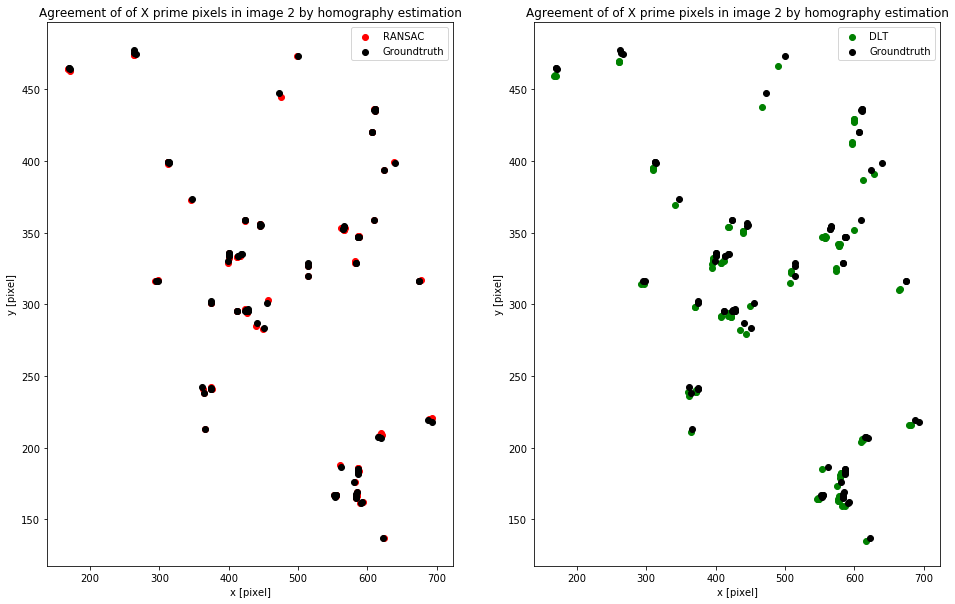

Error between x prime points on using H from RANSAC implemented and groundtruth (in pixels): 123
Error between x prime points on using H from DLT and groundtruth (in pixels): 795
Time taken to estimate H from RANSAC 0.01768 seconds and from DLT 0.00626 seconds


In [9]:
''' COMPARISON '''
plt.figure(figsize=(16,10))
plt.subplot(121)
plt.scatter(x_prime_computed_RANSAC[0], x_prime_computed_RANSAC[1], c= 'r', label='RANSAC')
plt.scatter(x_prime_in[0], x_prime_in[1], c = 'k', label='Groundtruth')
plt.title('Agreement of of X prime pixels in image 2 by homography estimation')
plt.xlabel('x [pixel]')
plt.ylabel('y [pixel]')
plt.legend()
plt.subplot(122)
plt.scatter(x_prime_computed_DLT[0], x_prime_computed_DLT[1], c ='g', label='DLT')
plt.scatter(x_prime_in[0], x_prime_in[1], c = 'k', label='Groundtruth')
plt.title('Agreement of of X prime pixels in image 2 by homography estimation')
plt.xlabel('x [pixel]')
plt.ylabel('y [pixel]')
plt.legend()
plt.show()

error_RANSAC = np.sqrt(np.square(x_prime_computed_RANSAC[0]- x_prime_in[0]) + np.square(x_prime_computed_RANSAC[1]- x_prime_in[1]))
print('Error between x prime points on using H from RANSAC implemented and groundtruth (in pixels):',math.ceil(sum(error_RANSAC)))

error_DLT = np.sqrt(np.square(x_prime_computed_DLT[0]- x_prime_in[0]) + np.square(x_prime_computed_DLT[1]- x_prime_in[1]))
print('Error between x prime points on using H from DLT and groundtruth (in pixels):',math.ceil(sum(error_DLT)))

print('Time taken to estimate H from RANSAC {} seconds and from DLT {} seconds'.format(time_RANSAC, time_DLT))

The final matplotlib images and the scatter plot illustrates the homography estimated from RANSAC is better relative to the DLT output.

YOUR ANSWER HERE

### b) Compare your new RANSAC algorithm to a handmade normalised DLT

HELP:
4 example pairs are provided in the folder data/:
1. BOAT using the correspondence point provided (boat_given)
2. BOAT using Oriented FAST and Rotated BRIEF (ORB) to calculate correspondence (boat)
3. MOUNT RUSHMORE using ORB to calculate correspondence (mount_rushmore)
4. NOTRE DAME using ORB to calculate correspondence (notredame)
Set the example name provided in the brackets for the variable EXAMPLE.
DEFAULT is boat.


************* RANSAC FOR BOAT ON ORB GIVEN CORRESPONDENCE POINTS ***************

Reading image1:  data/boat1.png
Reading image2:  data/boat2.png
Total number of putative correspondence: 100
Total iterations: 15
Number of inliers: 74
Desired homography, H computed using RANSAC:
 [[  0.86066301   0.20940676  10.82056447]
 [ -0.20867278   0.85528689 130.22072501]
 [  0.           0.           1.        ]]


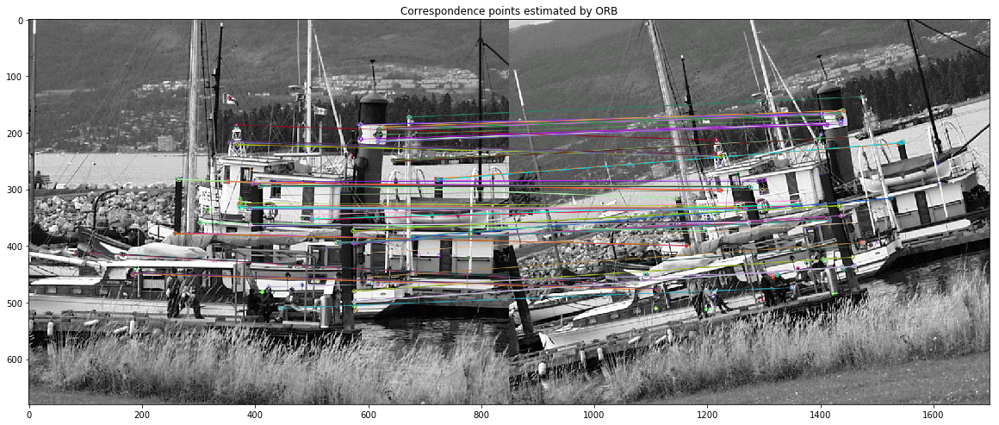

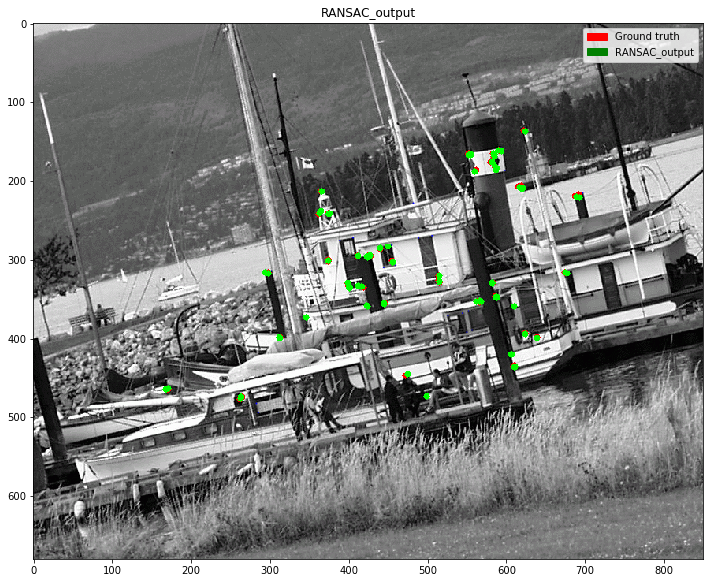


************* NORMALIZED DLT FOR BOAT ON ORB GIVEN CORRESPONDENCE POINTS ***************

Reading image1:  data/boat1.png
Reading image2:  data/boat2.png
Total number of putative correspondence: 100
Desired homography, H computed using Normalized DLT:
 [[  0.85610564   0.20699436  12.29430983]
 [ -0.21123523   0.85365608 130.89220648]
 [  0.           0.           1.        ]]


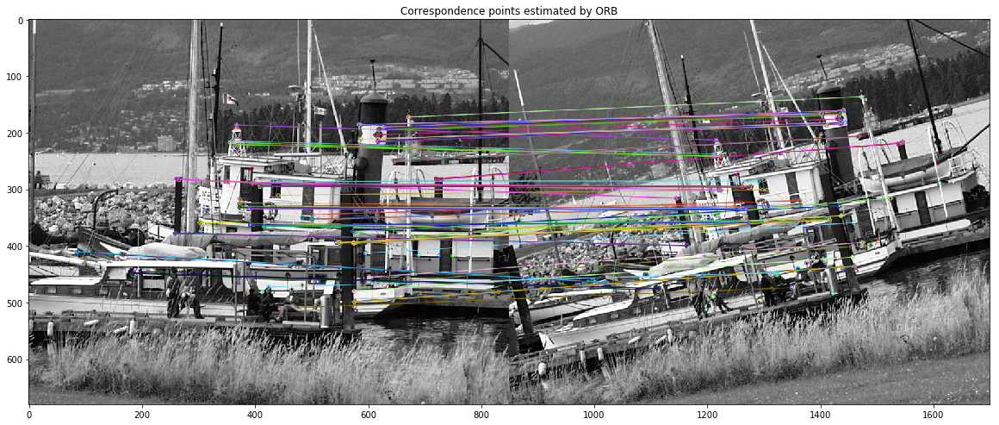

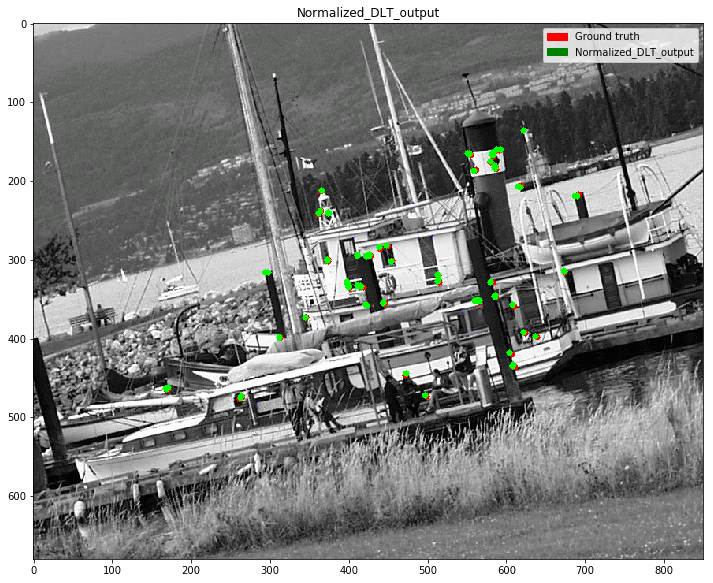

In [10]:
# HELP
print('HELP:\n4 example pairs are provided in the folder data/:\n1. BOAT using the correspondence point provided (boat_given)')
print('2. BOAT using Oriented FAST and Rotated BRIEF (ORB) to calculate correspondence (boat)')
print('3. MOUNT RUSHMORE using ORB to calculate correspondence (mount_rushmore)')
print('4. NOTRE DAME using ORB to calculate correspondence (notredame)')
print('Set the example name provided in the brackets for the variable EXAMPLE.\nDEFAULT is boat.\n')

print('\n************* RANSAC FOR BOAT ON ORB GIVEN CORRESPONDENCE POINTS ***************\n')

EXAMPLE = 'boat'
# Get initial corresponding points
x_in, x_prime_in, img_path1, img_path2 = get_inputs(EXAMPLE)

time1 = time.time()

homography = Perform_RANSAC()

# Perform RANSAC Get outliers
x, x_prime = homography.RANSAC(x_in,x_prime_in)

# Normalize x to overcome the numerical calculation issues in DLT
x_bar, T_bar = homography.normalize(x)

# Normalize x' to overcome the numerical calculation issues in DLT
x_prime_bar, T_prime_bar = homography.normalize(x_prime)

# Find H normalized
H_normalized = homography.DLT(x_bar, x_prime_bar)

# Find H mapping to original image scales.
H_RANSAC = homography.desired_H(T_bar, T_prime_bar, H_normalized)

time2 = time.time()
time_RANSAC = round(time2 - time1, 5)

print('Desired homography, H computed using RANSAC:\n', H_RANSAC)
x_prime_computed_RANSAC = draw_helper(H_RANSAC, x_in, x_prime_in, 'RANSAC_output', img_path2)

# Combining two different programs into a single cell because the second cell is used for comparison

class Perform_DLT():
    
    def __init__(self):
        
        np.set_printoptions(suppress=True)
        
    def normalize(self, x: np.ndarray) -> np.ndarray:
        
        '''
        Normalizes a given matrix, x by performing similarity transformation.
        Now the centroid of the new points has (0,0)^T and the average distance 
        from the origin is square.root(2)
        '''

        x_bar = np.asarray(x)
        m = np.mean(x,1)

        deno = list()

        for i in x.transpose():
            deno.append(list(i-m))
        deno = np.square(np.array(deno))
        total = 0
        for i in deno:
            total = sum(i)**(1/2.) + total

        s = 2**(1/2)/(total/len(deno))

        T = np.array([[s, 0, -s*m[0]], [0, s, -s*m[1]], [0, 0, 1]])

        x = np.vstack((x, np.ones((1,x.shape[1]))))

        x_bar = np.dot(T, x)
        
        return x_bar, T

    def DLT(self, x: np.ndarray, x_bar: np.ndarray) -> np.ndarray:
        '''
        Performs DLT on the x and x' provided
        '''

        # Initializations for A matrix
        a_12 = list()
        a_13 = list()
        a_21 = list()
        a_23 = list()
        result = list()
        
        # Forming A matrix as provided in Reference 1 and Hartley and zisserman multiple view geometry

        for i,j in zip(x.transpose(), x_bar.transpose()):

            a_12= np.array([list(-np.dot(j[2],i.transpose()))])
            a_13= np.array([list(np.dot(j[1],i.transpose()))])
            a_21= np.array([list(np.dot(j[2],i.transpose()))])
            a_23= np.array([list(-np.dot(j[0],i.transpose()))])

            r1 = np.hstack((np.hstack((np.zeros((1,3)),a_12)),a_13))
            r2 = np.hstack((np.hstack((a_21,np.zeros((1,3)))),a_23))

            a = np.vstack((r1,r2))   

            for k in a:
                result.append(list(k))

        A = np.array(result)
        
        
        # Ah = 0 ;Minimizing ||Ah|| such that ||h||=1
        # Solution by SVD
        
        U,s,Vt = np.linalg.svd(A)
        V=Vt.T
        h=V[:,-1] # Last column of V corresponding eigen vector to the smallest eigen value
        
        h = np.reshape(h,(3,3))

        return h
    
    def desired_H(self, T_bar, T_prime_bar, H_normalized):
        
        '''
        Used for finding H in unnormalized original co-ordinates from normalized H' by performing,
        H = inverse(T') H' T
        '''
        non_scaled_H = np.dot(np.linalg.inv(T_prime_bar),(np.dot(H_normalized, T_bar)))
        # Scaling H such that H(3,3) is 1.
        desired_H = non_scaled_H/non_scaled_H[2][2]
        
        # Since H is affine transformation, H[2][0] and H[2][1] = 0
        desired_H[2][0] = desired_H[2][1] = 0
        
        return desired_H

print('\n************* NORMALIZED DLT FOR BOAT ON ORB GIVEN CORRESPONDENCE POINTS ***************\n')
    
EXAMPLE = 'boat'

# Get initial corresponding points
x_in, x_prime_in, img_path1, img_path2 = get_inputs(EXAMPLE)

time1 = time.time()

homography = Perform_DLT()

# Normalize x to overcome the numerical calculation issues in DLT
x_bar, T_bar = homography.normalize(x_in)

# Normalize x' to overcome the numerical calculation issues in DLT
x_prime_bar, T_prime_bar = homography.normalize(x_prime_in)

# Find H normalized
H_normalized = homography.DLT(x_bar, x_prime_bar)

# Find H mapping to original image scales.
H_NDLT = homography.desired_H(T_bar, T_prime_bar, H_normalized)

time2 = time.time()
time_NDLT = round(time2 - time1, 5)
print('Desired homography, H computed using Normalized DLT:\n', H_NDLT)

x_prime_computed_NDLT = draw_helper(H_NDLT, x_in, x_prime_in, 'Normalized_DLT_output', img_path2)

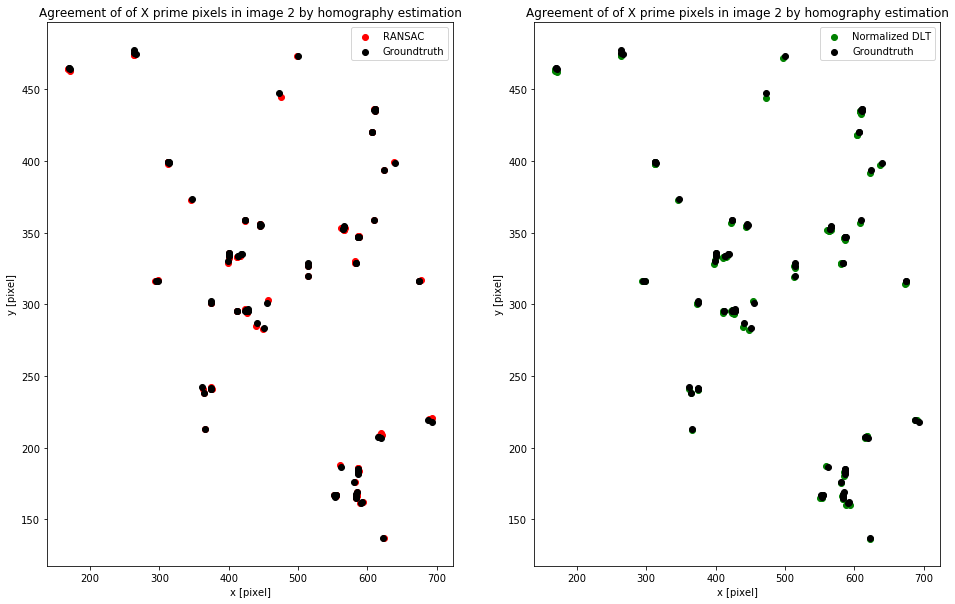

Error between x prime points on using H from RANSAC implemented and groundtruth (in pixels): 123
Error between x prime points on using H from Normalized DLT and groundtruth (in pixels): 210
Time taken to estimate H from RANSAC 0.01716 seconds and from Normalized DLT 0.00702 seconds


In [11]:
''' COMPARISON '''
plt.figure(figsize=(16,10))
plt.subplot(121)
plt.scatter(x_prime_computed_RANSAC[0], x_prime_computed_RANSAC[1], c= 'r', label='RANSAC')
plt.scatter(x_prime_in[0], x_prime_in[1], c = 'k', label='Groundtruth')
plt.title('Agreement of of X prime pixels in image 2 by homography estimation')
plt.xlabel('x [pixel]')
plt.ylabel('y [pixel]')
plt.legend()
plt.subplot(122)
plt.scatter(x_prime_computed_NDLT[0], x_prime_computed_NDLT[1], c ='g', label='Normalized DLT')
plt.scatter(x_prime_in[0], x_prime_in[1], c = 'k', label='Groundtruth')
plt.title('Agreement of of X prime pixels in image 2 by homography estimation')
plt.xlabel('x [pixel]')
plt.ylabel('y [pixel]')
plt.legend()
plt.show()

error_RANSAC = np.sqrt(np.square(x_prime_computed_RANSAC[0]- x_prime_in[0]) + np.square(x_prime_computed_RANSAC[1]- x_prime_in[1]))
print('Error between x prime points on using H from RANSAC implemented and groundtruth (in pixels):',math.ceil(sum(error_RANSAC)))

error_lib_NDLT = np.sqrt(np.square(x_prime_computed_NDLT[0]- x_prime_in[0]) + np.square(x_prime_computed_NDLT[1]- x_prime_in[1]))
print('Error between x prime points on using H from Normalized DLT and groundtruth (in pixels):',math.ceil(sum(error_lib_NDLT)))


print('Time taken to estimate H from RANSAC {} seconds and from Normalized DLT {} seconds'.format(time_RANSAC, time_NDLT))


For the given example, RANSAC has lesser error than Normalized DLT. However, since RANSAC is iterative, the total time taken is high relative to normalized DLT. It performs normalized DLT for a specified number of iterations.

YOUR ANSWER HERE

### c) Compare your new RANSAC algorithm to a library RANSAC implementation.

HELP:
4 example pairs are provided in the folder data/:
1. BOAT using the correspondence point provided (boat_given)
2. BOAT using Oriented FAST and Rotated BRIEF (ORB) to calculate correspondence (boat)
3. MOUNT RUSHMORE using ORB to calculate correspondence (mount_rushmore)
4. NOTRE DAME using ORB to calculate correspondence (notredame)
Set the example name provided in the brackets for the variable EXAMPLE.
DEFAULT is boat.


************* RANSAC FOR BOAT ON ORB GIVEN CORRESPONDENCE POINTS ***************

Reading image1:  data/boat1.png
Reading image2:  data/boat2.png
Total number of putative correspondence: 100
Total iterations: 15
Number of inliers: 74
Desired homography, H computed using RANSAC:
 [[  0.86066301   0.20940676  10.82056447]
 [ -0.20867278   0.85528689 130.22072501]
 [  0.           0.           1.        ]]


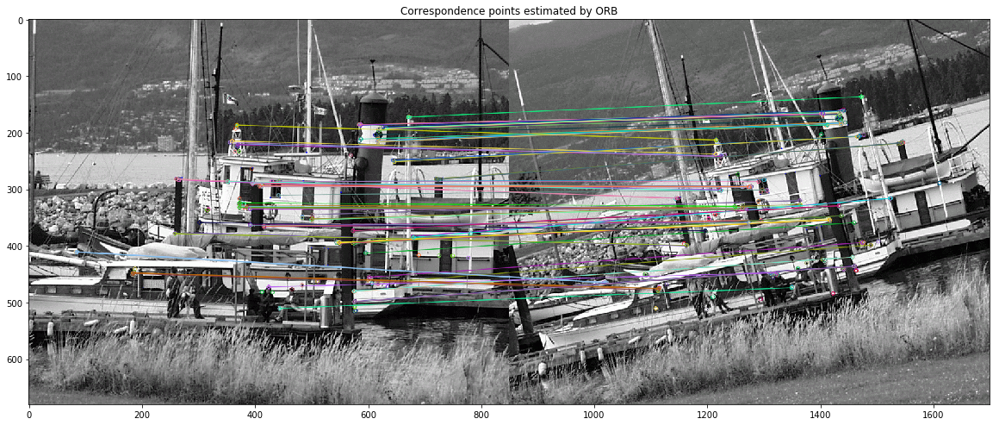

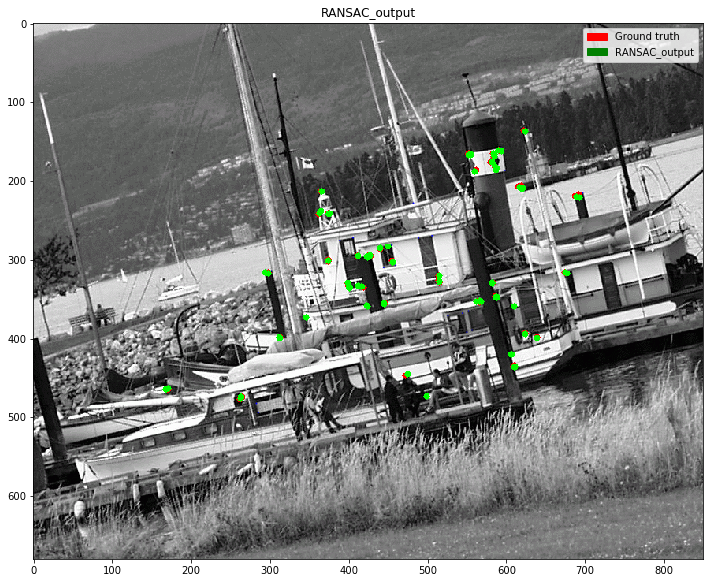


************* OPENCV LIBRARY RANSAC FOR BOAT ON ORB GIVEN CORRESPONDENCE POINTS ***************

Reading image1:  data/boat1.png
Reading image2:  data/boat2.png
Total number of putative correspondence: 100
Desired homography, H computed using OpenCV Library implementation of RANSAC:
 [[  0.85609458   0.20688414  12.33136432]
 [ -0.21121161   0.8535385  130.91363114]
 [  0.           0.           1.        ]]


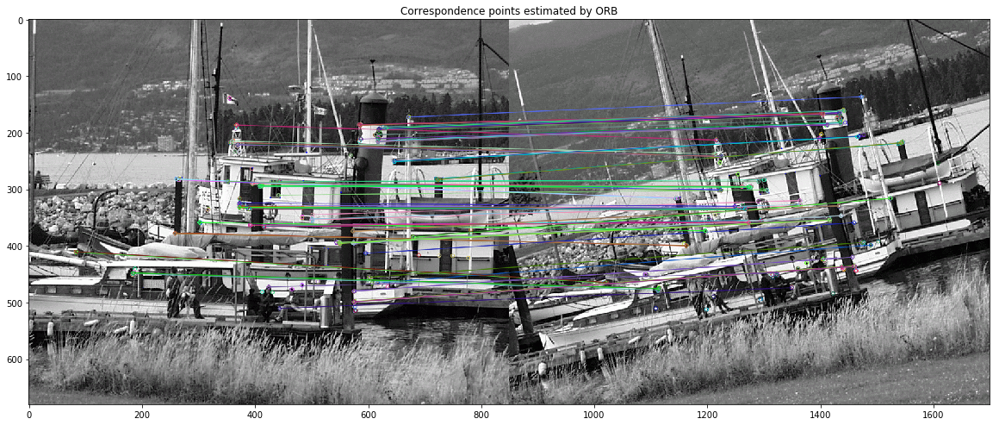

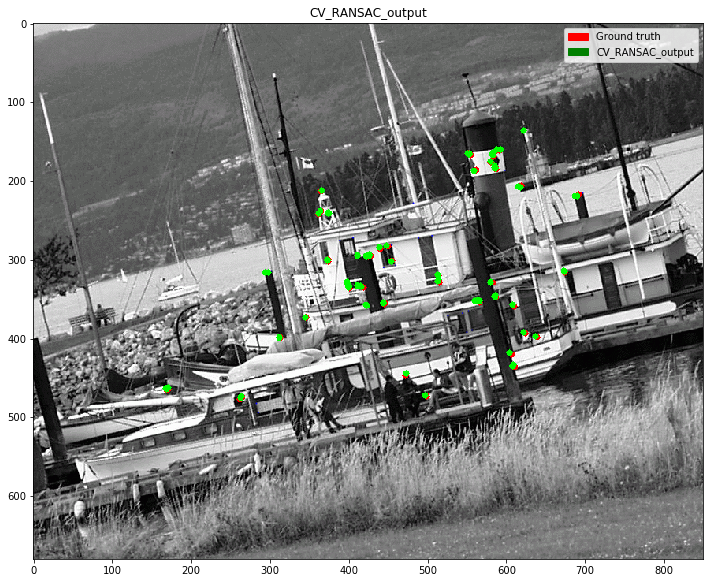

In [12]:
# HELP
print('HELP:\n4 example pairs are provided in the folder data/:\n1. BOAT using the correspondence point provided (boat_given)')
print('2. BOAT using Oriented FAST and Rotated BRIEF (ORB) to calculate correspondence (boat)')
print('3. MOUNT RUSHMORE using ORB to calculate correspondence (mount_rushmore)')
print('4. NOTRE DAME using ORB to calculate correspondence (notredame)')
print('Set the example name provided in the brackets for the variable EXAMPLE.\nDEFAULT is boat.\n')

print('\n************* RANSAC FOR BOAT ON ORB GIVEN CORRESPONDENCE POINTS ***************\n')

EXAMPLE = 'boat'
# Get initial corresponding points
x_in, x_prime_in, img_path1, img_path2 = get_inputs(EXAMPLE)

time1 = time.time()
homography = Perform_RANSAC()
# Perform RANSAC Get outliers
x, x_prime = homography.RANSAC(x_in,x_prime_in)

# Normalize x to overcome the numerical calculation issues in DLT
x_bar, T_bar = homography.normalize(x)

# Normalize x' to overcome the numerical calculation issues in DLT
x_prime_bar, T_prime_bar = homography.normalize(x_prime)

# Find H normalized
H_normalized = homography.DLT(x_bar, x_prime_bar)

# Find H mapping to original image scales.
H_RANSAC = homography.desired_H(T_bar, T_prime_bar, H_normalized)

time2 = time.time()
time_RANSAC = round(time2 - time1, 5)

print('Desired homography, H computed using RANSAC:\n', H_RANSAC)
x_prime_computed_RANSAC = draw_helper(H_RANSAC, x_in, x_prime_in, 'RANSAC_output', img_path2)

# Combining two different programs into a single cell because the second cell is used for comparison

print('\n************* OPENCV LIBRARY RANSAC FOR BOAT ON ORB GIVEN CORRESPONDENCE POINTS ***************\n')


class Library_RANSAC():
    
    def __init__(self):
        
        np.set_printoptions(suppress=True)
    
    def calculate_H(self, x, x_prime):
        
        x = np.array(list(map(list, zip(*x))))
        x_prime = np.array(list(map(list, zip(*x_prime))))
        H , _= cv2.findHomography(x, x_prime, cv2.RANSAC, 5)
        H [2][0] = H[2][1] = 0 # Considering the affine nature of H
        return H

EXAMPLE = 'boat'

x_in, x_prime_in, img_path1, img_path2 = get_inputs(EXAMPLE)

time1 = time.time()
homography = Library_RANSAC()
H_CV_RANSAC = homography.calculate_H(x_in, x_prime_in)
time2 = time.time()
time_CV_RANSAC = round(time2 - time1, 5)
print('Desired homography, H computed using OpenCV Library implementation of RANSAC:\n',H_CV_RANSAC)
x_prime_computed_lib_RANSAC = draw_helper(H_CV_RANSAC, x_in, x_prime_in, 'CV_RANSAC_output', img_path2)


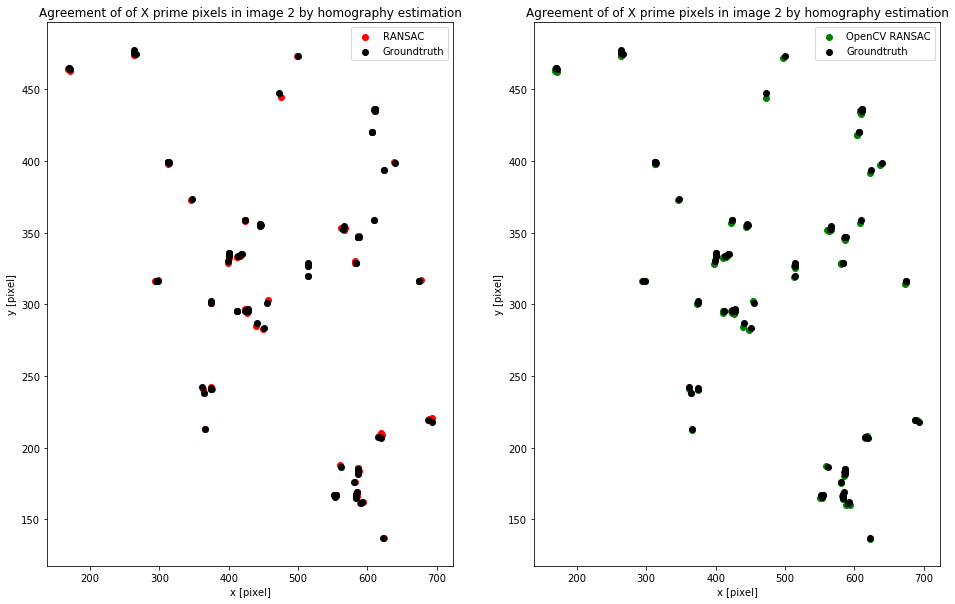

Error between x prime points on using H from RANSAC implemented and groundtruth (in pixels): 123
Error between x prime points on using H from OpenCV RANSAC and groundtruth (in pixels): 210
Time taken to estimate H from RANSAC 0.01462 seconds and from OpenCV RANSAC 0.00056 seconds


In [13]:
''' COMPARISON '''
plt.figure(figsize=(16,10))
plt.subplot(121)
plt.scatter(x_prime_computed_RANSAC[0], x_prime_computed_RANSAC[1], c= 'r', label='RANSAC')
plt.scatter(x_prime_in[0], x_prime_in[1], c = 'k', label='Groundtruth')
plt.title('Agreement of of X prime pixels in image 2 by homography estimation')
plt.xlabel('x [pixel]')
plt.ylabel('y [pixel]')
plt.legend()

plt.subplot(122)
plt.scatter(x_prime_computed_lib_RANSAC[0], x_prime_computed_lib_RANSAC[1], c ='g', label='OpenCV RANSAC')
plt.scatter(x_prime_in[0], x_prime_in[1], c = 'k', label='Groundtruth')
plt.title('Agreement of of X prime pixels in image 2 by homography estimation')
plt.xlabel('x [pixel]')
plt.ylabel('y [pixel]')
plt.legend()
plt.show()

error_RANSAC = np.sqrt(np.square(x_prime_computed_RANSAC[0]- x_prime_in[0]) + np.square(x_prime_computed_RANSAC[1]- x_prime_in[1]))
print('Error between x prime points on using H from RANSAC implemented and groundtruth (in pixels):',math.ceil(sum(error_RANSAC)))

error_lib_RANSAC = np.sqrt(np.square(x_prime_computed_lib_RANSAC[0]- x_prime_in[0]) + np.square(x_prime_computed_lib_RANSAC[1]- x_prime_in[1]))
print('Error between x prime points on using H from OpenCV RANSAC and groundtruth (in pixels):',math.ceil(sum(error_lib_RANSAC)))

print('Time taken to estimate H from RANSAC {} seconds and from OpenCV RANSAC {} seconds'.format(time_RANSAC, time_CV_RANSAC))


Apart from the explicit differences between RANSAC implemented and library OpenCV RANSAC for H estimation, the OpenCV RANSAC to estimate H matches with the normalized DLT implemented in few cells above. The error and time taken are matching between normalized DLT implemented and OpenCV RANSAC.

YOUR ANSWER HERE

References:
    
1. Yiannis Aloimonos, Jack Rasiel, and Kaan Elgin, CMSC 426 Computer Vision Homework 1, Accessed on: 04.05.2020 [Online], URL: https://www.cs.umd.edu/class/spring2018/cmsc426/Assignments/cmsc426_hw1_answer_key.pdf.
2. Kris Kitani, RANSAC, 16-385 Computer Vision, Carnegie Mellon University, Accessed on: 04.05.2020 [Online], URL: http://www.cs.cmu.edu/~16385/s17/Slides/10.3_2D_Alignment__RANSAC.pdf.
3. Cyrill Stachniss, Photogrammetry II Chapter SIFT features and RANSAC, University of Bonn, Accessed on: 04.05.2020 [Online], URL: https://www.youtube.com/watch?v=oT9c_LlFBqs.
4. Satya Mallick, Image Alignment (Feature Based) using OpenCV (C++/Python), Learn OpenCV, Accessed on: 10.05.2020[Online]. URL: https://www.learnopencv.com/image-alignment-feature-based-using-opencv-c-python/.
5. 4. Zuliani, Marco. "RANSAC for Dummies." Vision Research Lab, University of California, Santa Barbara. 2009. URL: http://www.cs.tau.ac.il/~turkel/imagepapers/RANSAC4Dummies.pdf